(1) Search EDA for things that look weird.<br> (2) Verify weirdness by comparing to randomly generated data and confirm that those weird things are in test data<br> (3) Create new features to capture what you see<br> (4) Add to model and tune your model hyperparameters. (5) Confirm CV increases and submit<br>
-cdeotte

People are getting stressed out because they read all the forum topics all day and they do not discover what "magic" is.<br>

If they start to waste time with data mining, they will find the magic. But it seems that this will not be the case.<br>

In [2]:
import feather as ftr
import gc
import os
import logging
import datetime
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import lightgbm as lgb
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import StratifiedKFold
warnings.filterwarnings('ignore')
train = ftr.read_dataframe("../data/input/min_maxed_train.feather")
test = ftr.read_dataframe("../data/input/min_maxed_test.feather")

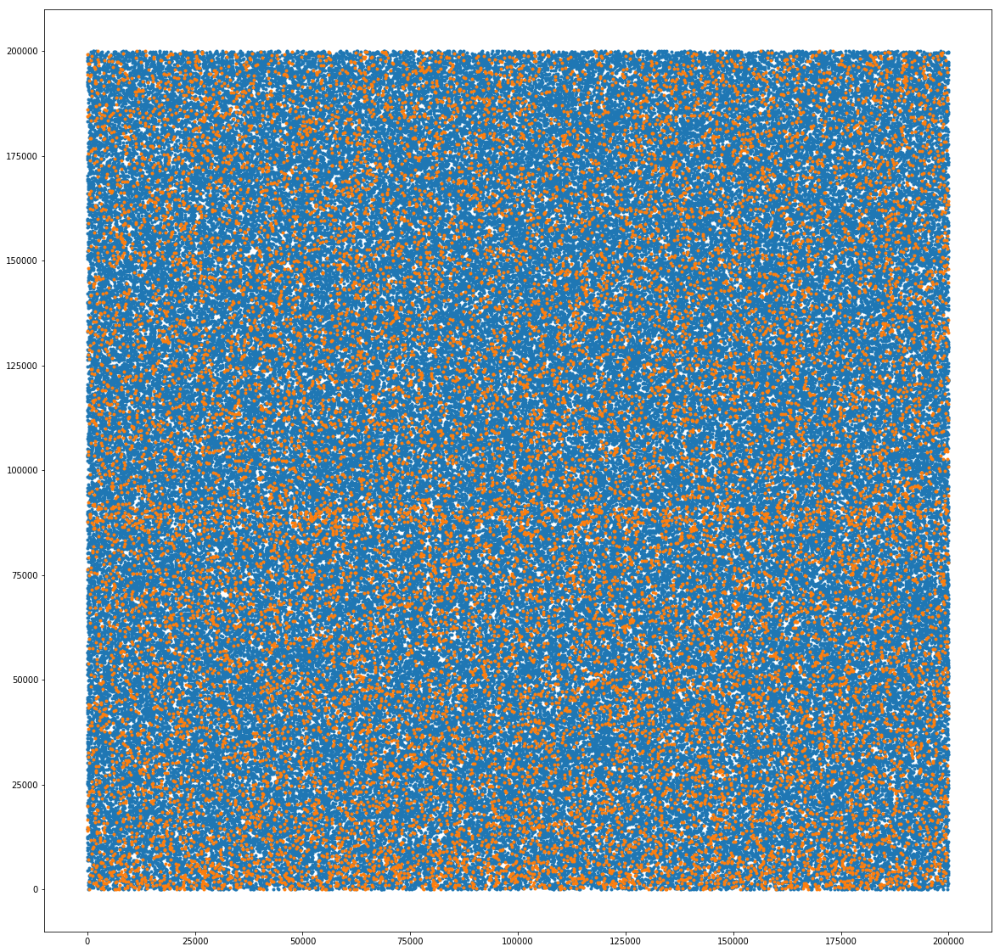

In [8]:
#縦が順位,横が行番号。一定の順位だけ、
train['var_108_rank']=train['var_108'].rank()
train.loc[train['target']==0]['var_108_rank'].plot(figsize=(20,20),style='.')
train.loc[train['target']==1]['var_108_rank'].plot(figsize=(20,20),style='.')

In [ ]:
test['var_108'].nu

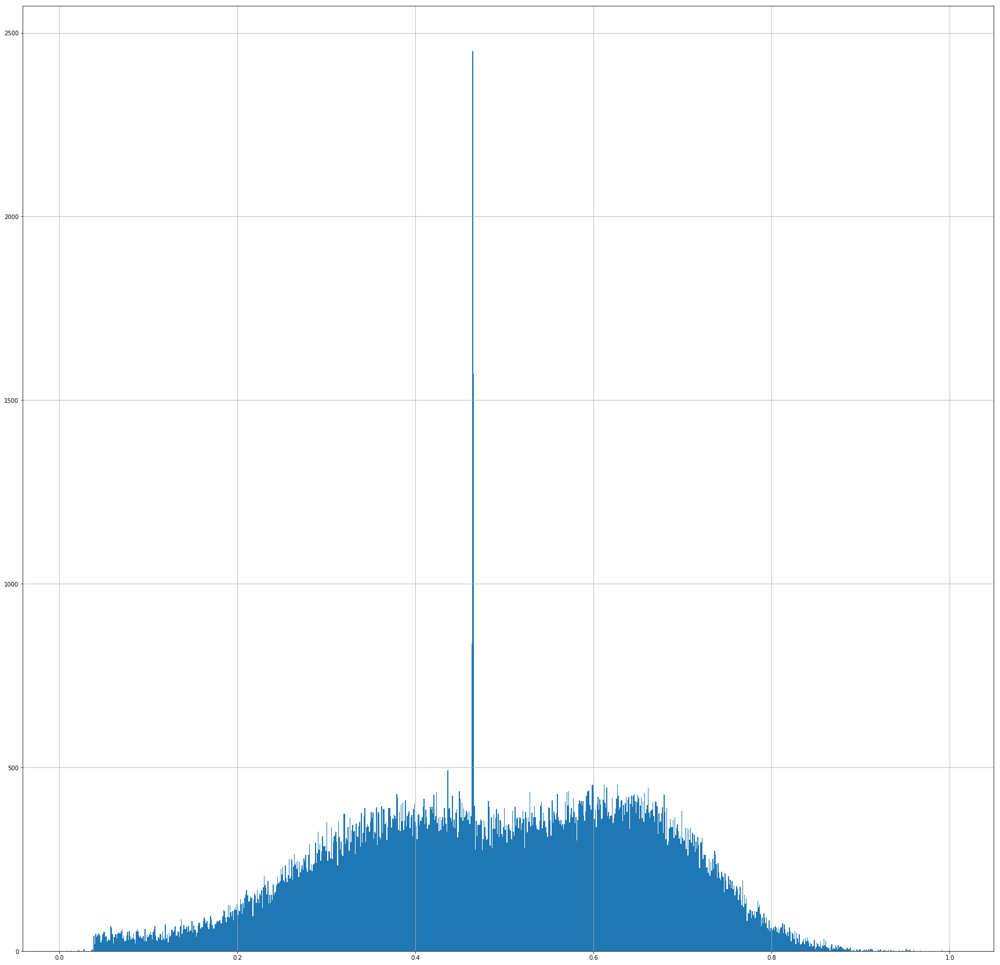

In [24]:
test['var_108'].hist(figsize=(30,30),bins=1000)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_108_rank,var_68_rank,var_126_rank
2,train_2,0,0.411969,0.483777,0.578061,0.599690,0.474941,0.471329,0.753295,0.414724,...,0.448000,0.671183,0.881350,0.236337,0.381950,0.425833,0.582736,85604.5,138007.5,176242.5
15,train_15,0,0.177489,0.696281,0.652487,0.523846,0.621372,0.329235,0.549243,0.407643,...,0.524656,0.715920,0.605618,0.637448,0.385658,0.334296,0.503828,89696.0,16051.5,79224.0
18,train_18,0,0.224378,0.641537,0.568691,0.642945,0.486824,0.640217,0.534883,0.497554,...,0.548019,0.384582,0.390963,0.310896,0.434899,0.548656,0.247334,89442.5,14398.5,153066.5
58,train_58,0,0.462656,0.404375,0.440841,0.312628,0.709432,0.650865,0.478772,0.503910,...,0.768141,0.659256,0.807214,0.362856,0.219378,0.498281,0.622137,90162.0,197312.0,28139.5
60,train_60,0,0.269504,0.617501,0.421742,0.473931,0.382741,0.563875,0.548882,0.311801,...,0.541783,0.368896,0.461396,0.509067,0.305523,0.525117,0.317813,86072.5,11332.0,92457.0
71,train_71,1,0.318804,0.693964,0.701849,0.634358,0.208630,0.627474,0.309209,0.433021,...,0.444404,0.498461,0.096519,0.648503,0.562287,0.637115,0.774978,87620.0,32558.0,30356.0
77,train_77,0,0.293400,0.314671,0.406732,0.371403,0.797958,0.886773,0.647646,0.550749,...,0.372584,0.567473,0.684557,0.538620,0.389334,0.397785,0.529814,94237.5,199462.0,44415.5
103,train_103,0,0.361282,0.569673,0.326133,0.422686,0.313178,0.675727,0.347502,0.605341,...,0.414250,0.383594,0.590524,0.548497,0.422034,0.359377,0.454434,87850.0,191039.0,17002.5
125,train_125,0,0.452744,0.376488,0.440070,0.435567,0.727955,0.515773,0.349125,0.306945,...,0.483529,0.474686,0.530224,0.421434,0.309480,0.572230,0.447119,94943.0,93879.0,138073.5
159,train_159,0,0.501321,0.434835,0.696964,0.208474,0.506321,0.566664,0.464461,0.421088,...,0.545365,0.618111,0.643042,0.478155,0.353207,0.639137,0.193531,91711.0,177347.0,148097.5


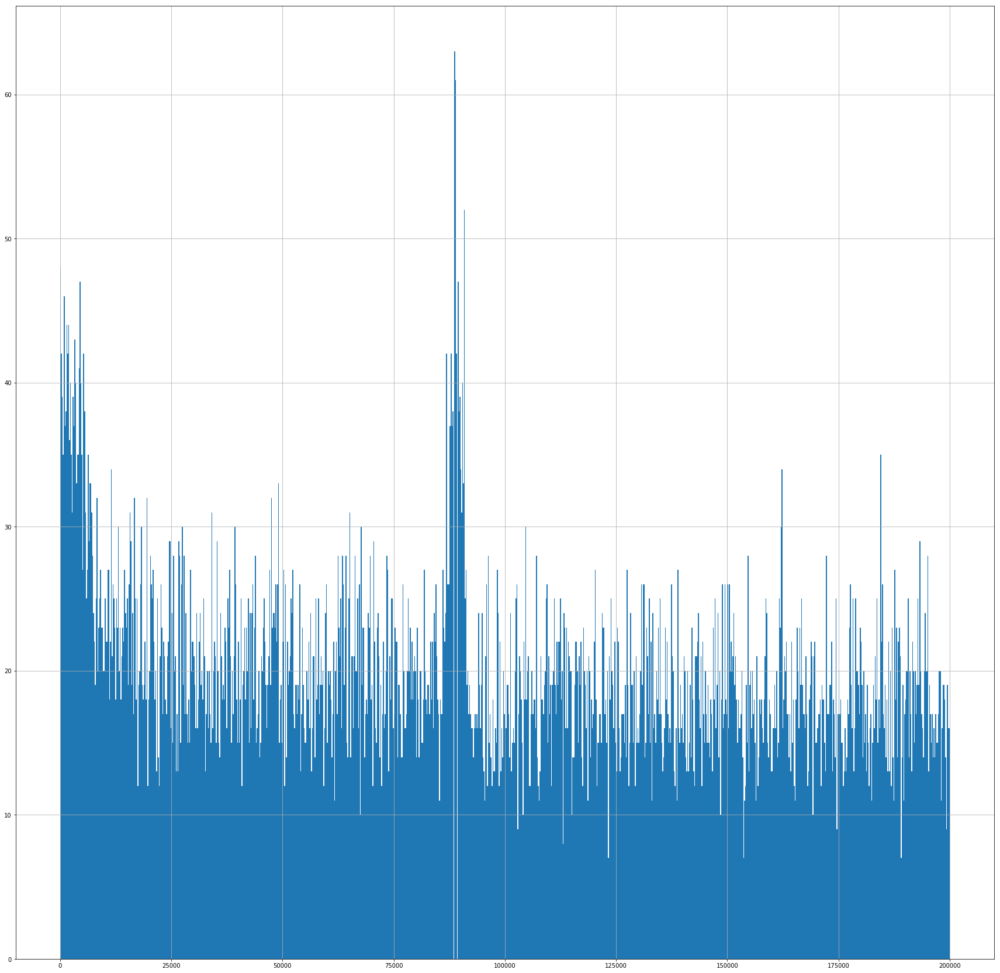

In [27]:
train.loc[train['target']==1]['var_108_rank'].hist(figsize=(30,30),bins=1000)
train.query(' 85000< var_108_rank <95000 ')

In [34]:
train['spike_var_108']=0
spike108_index=train.query('0.463<var_108<0.465').index.values
train.loc[spike108_index,'spike_var_108']=1

In [35]:
train['spike_var_108']

0         0
1         0
2         0
3         0
4         0
5         0
6         0
7         0
8         0
9         0
10        0
11        0
12        0
13        0
14        0
15        1
16        0
17        0
18        1
19        0
20        0
21        0
22        0
23        0
24        0
25        0
26        0
27        0
28        0
29        0
         ..
199970    0
199971    0
199972    0
199973    0
199974    0
199975    0
199976    0
199977    0
199978    0
199979    0
199980    0
199981    0
199982    0
199983    0
199984    0
199985    0
199986    0
199987    0
199988    0
199989    0
199990    0
199991    0
199992    0
199993    0
199994    0
199995    0
199996    0
199997    0
199998    0
199999    0
Name: spike_var_108, Length: 200000, dtype: int64

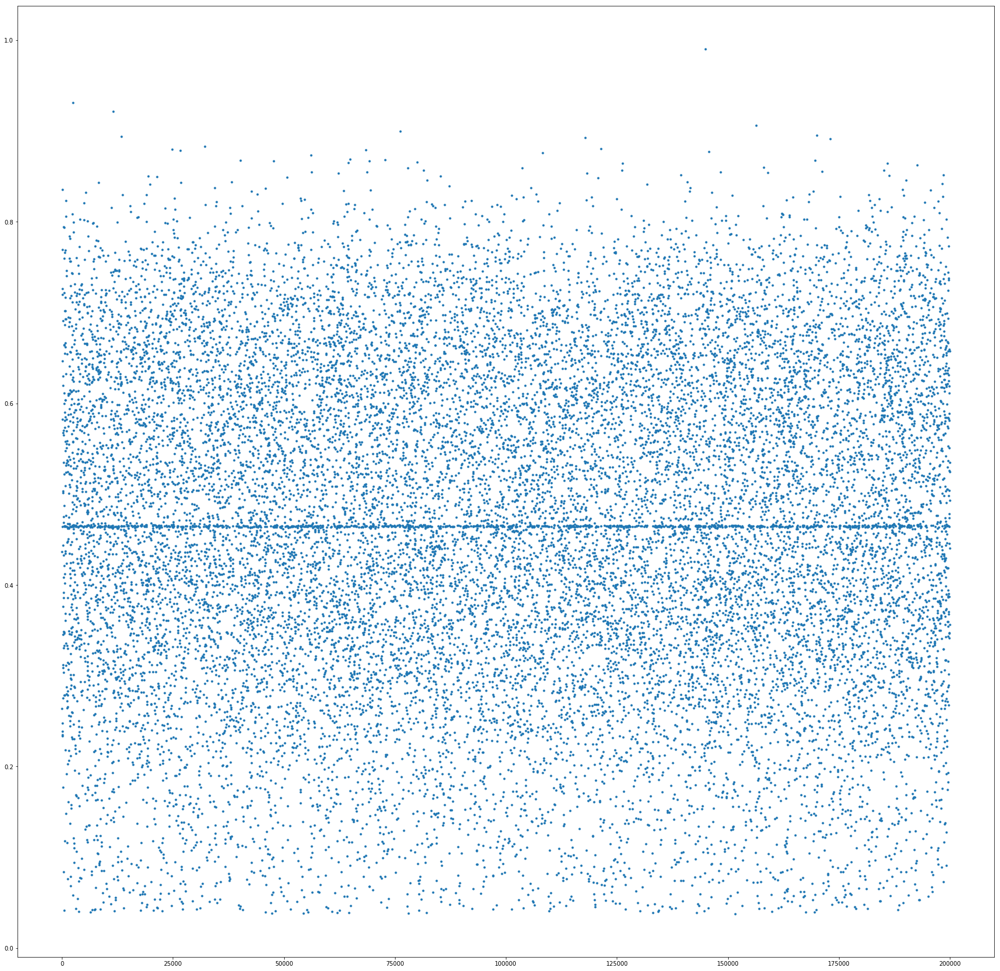

In [16]:
train.loc[train['target']==1]['var_108'].plot(figsize=(30,30),style='.')

In [ ]:
train

In [28]:
train.loc[train['target']==1]['var_108'].value_counts()

0.464398    63
0.464497    61
0.464694    47
0.464596    42
0.464103    42
0.465187    40
0.464892    39
0.464793    38
0.464300    38
0.464201    37
0.464004    37
0.464990    34
0.465385    33
0.465286    33
0.465089    31
0.463807    26
0.463905    26
0.463708    26
0.463609    24
0.465483    19
0.463511    18
0.465582    15
0.463412    13
0.463314    11
0.463215    11
0.428205    11
0.442209    11
0.295858    10
0.455917    10
0.547633    10
            ..
0.170414     1
0.662327     1
0.106410     1
0.108481     1
0.710552     1
0.131953     1
0.601282     1
0.209665     1
0.115187     1
0.704832     1
0.286785     1
0.573570     1
0.135799     1
0.180572     1
0.397436     1
0.049310     1
0.295069     1
0.160454     1
0.100690     1
0.659862     1
0.248915     1
0.393984     1
0.525148     1
0.201381     1
0.711045     1
0.179684     1
0.143393     1
0.489546     1
0.229882     1
0.366469     1
Name: var_108, Length: 6786, dtype: int64

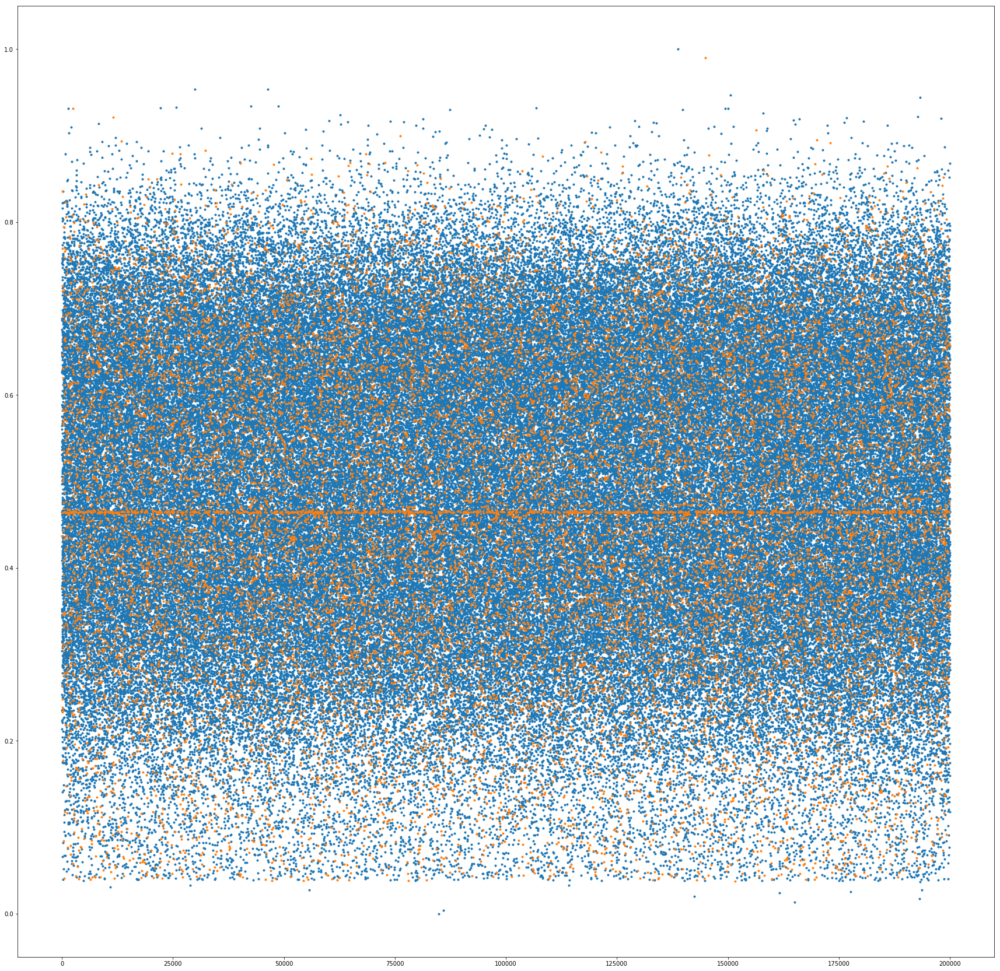

In [9]:
train.loc[train['target']==0]['var_108'].plot(figsize=(30,30),style='.')
train.loc[train['target']==1]['var_108'].plot(figsize=(30,30),style='.')

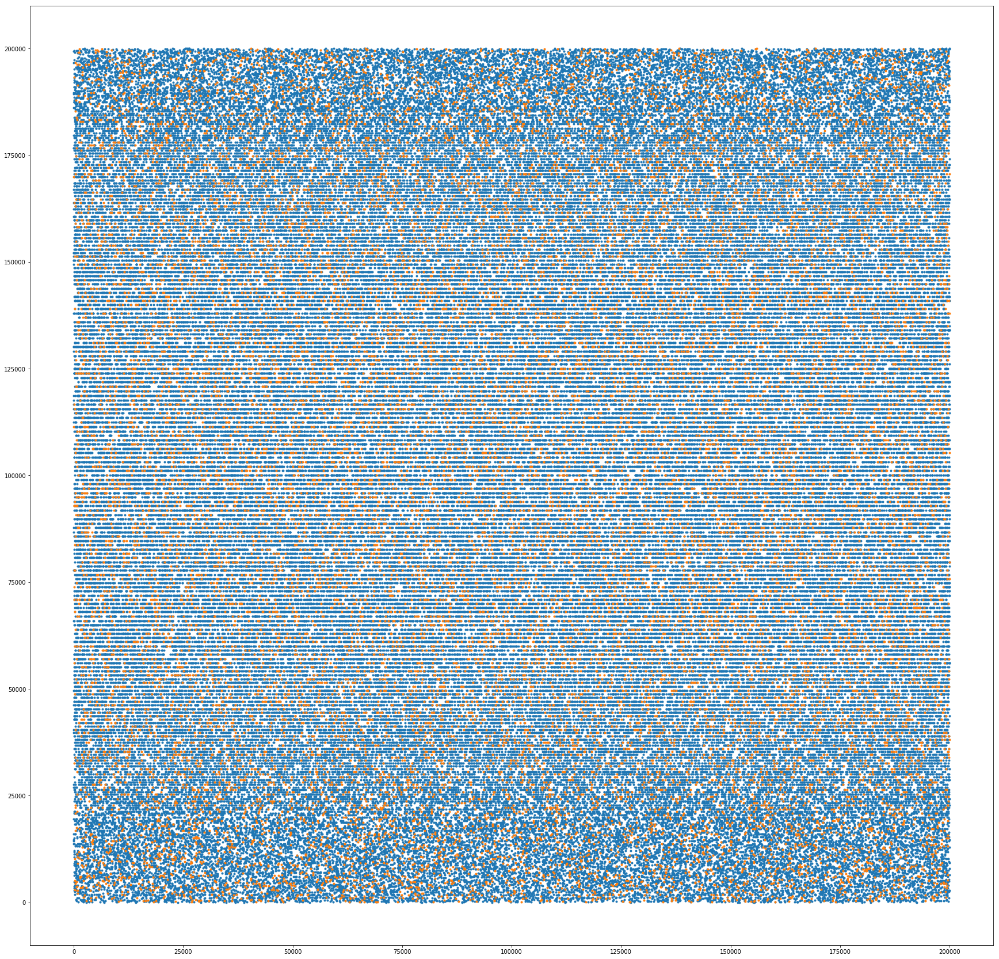

In [11]:
train['var_68_rank']=train['var_68'].rank()
train.loc[train['target']==0]['var_68_rank'].plot(figsize=(30,30),style='.')
train.loc[train['target']==1]['var_68_rank'].plot(figsize=(30,30),style='.')

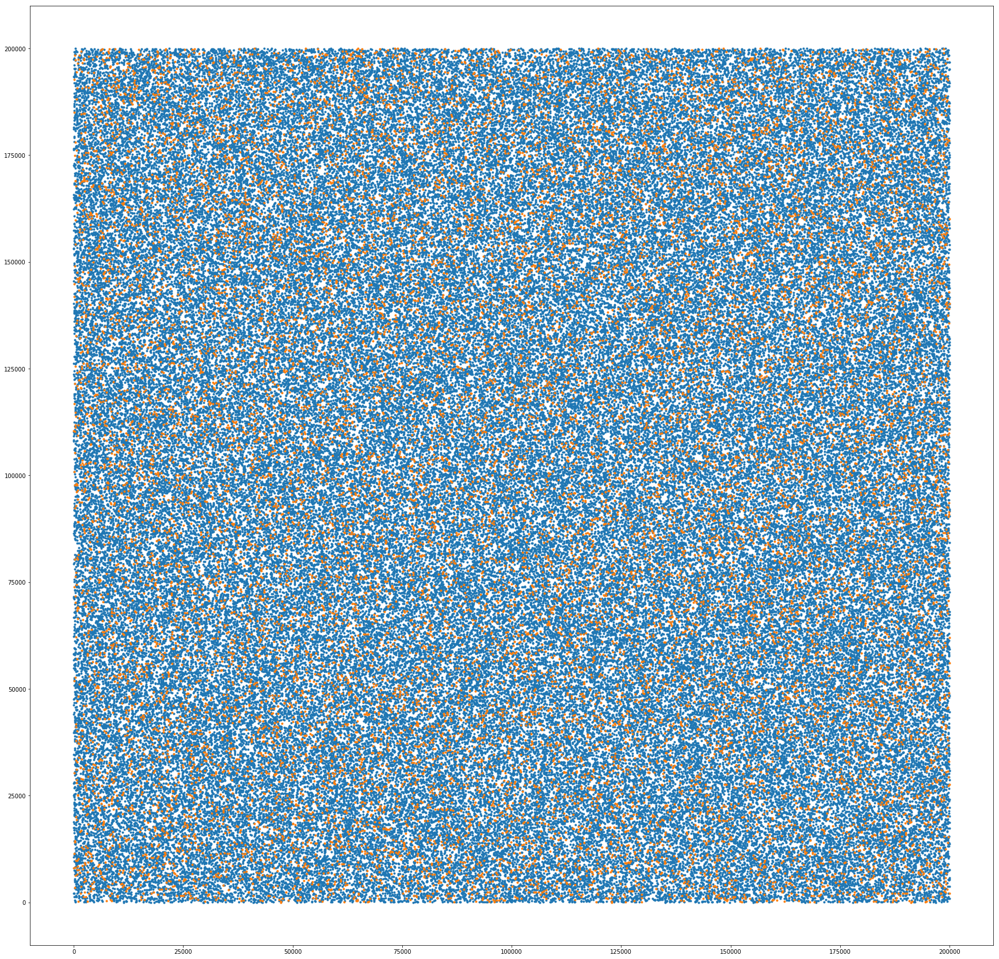

In [13]:
train['var_126_rank']=train['var_126'].rank()
train.loc[train['target']==0]['var_126_rank'].plot(figsize=(30,30),style='.')
train.loc[train['target']==1]['var_126_rank'].plot(figsize=(30,30),style='.')